# Batch Audio-to-MIDI-to-Audio Converter

This notebook performs batch conversion of audio files to MIDI and back to audio using basic_pitch for transcription and FluidSynth for synthesis. It includes progress tracking and audio visualization.

**Process:**
1. Audio → MIDI (using basic_pitch)
2. MIDI → Audio (using FluidSynth)
3. Visualization and comparison of original vs. resynthesized audio

## 1. Import Required Libraries and Setup

In [1]:
import sys
import os
from pathlib import Path
from typing import Dict, List
import time
from datetime import datetime

# Add parent directory to path for imports
sys.path.insert(0, str(Path.cwd().parent / "utills"))

import librosa
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import soundfile as sf

# Import our converter class
from utills.audio_midi_converter import AudioMidiConverter

print("✓ All libraries imported successfully!")
print(f"Current working directory: {Path.cwd()}")

c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\.venv\lib\site-packages\resampy\filters.py:50: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


✓ All libraries imported successfully!
Current working directory: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\notebooks


## 2. Initialize the Converter

In [2]:
print("Initializing AudioMidiConverter...")
print("=" * 60)

try:
    converter = AudioMidiConverter()
    print("✓ Converter initialized successfully!")
    print(f"  Soundfont: {converter.soundfont_path}")
    print(f"  FluidSynth: {converter.fluidsynth_path}")
    print("=" * 60)
except Exception as e:
    print(f"✗ Error initializing converter: {e}")
    raise

Initializing AudioMidiConverter...
✓ Converter initialized successfully!
  Soundfont: C:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\TimGM6mb.sf2
  FluidSynth: C:\Users\Dhanuja\scoop\apps\fluidsynth\current\bin\fluidsynth.exe


## 3. Define Batch Processing Function

In [3]:
def batch_convert_audio_files(input_dir: str, output_dir: str, 
                               audio_formats: List[str] = None) -> Dict[str, str]:
    """
    Batch convert audio files to MIDI and back to audio.
    
    Args:
        input_dir: Directory containing audio files
        output_dir: Directory to save converted files
        audio_formats: List of audio extensions to process
        
    Returns:
        Dictionary mapping input files to output files
    """
    if audio_formats is None:
        audio_formats = ['.wav', '.mp3', '.flac']
    
    # Validate input directory
    if not os.path.exists(input_dir):
        raise FileNotFoundError(f"Input directory not found: {input_dir}")
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Find all audio files
    audio_files = []
    for ext in audio_formats:
        audio_files.extend(Path(input_dir).glob(f"*{ext}"))
        audio_files.extend(Path(input_dir).glob(f"*{ext.upper()}"))
    
    # Remove duplicates
    audio_files = list(set(audio_files))
    
    if not audio_files:
        print(f"✗ No audio files found in {input_dir}")
        return {}
    
    results = {}
    start_time = time.time()
    
    print(f"\n{'='*70}")
    print(f"🎵 BATCH CONVERSION STARTED")
    print(f"{'='*70}")
    print(f"Input Directory:  {os.path.abspath(input_dir)}")
    print(f"Output Directory: {os.path.abspath(output_dir)}")
    print(f"Files to Process: {len(audio_files)}")
    print(f"Start Time:       {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"{'='*70}\n")
    
    # Process each audio file
    for idx, audio_file in enumerate(audio_files, 1):
        file_start = time.time()
        file_name = audio_file.name
        
        print(f"[{idx}/{len(audio_files)}] Processing: {file_name}")
        print(f"  └─ Started at {datetime.now().strftime('%H:%M:%S')}")
        
        try:
            # Convert audio to MIDI to audio
            output_audio = converter.convert(str(audio_file), output_dir)
            results[str(audio_file)] = output_audio
            
            file_duration = time.time() - file_start
            output_size = os.path.getsize(output_audio) / (1024 * 1024)  # MB
            
            print(f"  └─ ✓ Success ({file_duration:.1f}s, {output_size:.2f} MB)")
            print(f"  └─ Output: {Path(output_audio).name}\n")
            
        except Exception as e:
            print(f"  └─ ✗ Error: {str(e)}\n")
            results[str(audio_file)] = None
    
    total_duration = time.time() - start_time
    successful = sum(1 for v in results.values() if v is not None)
    
    print(f"{'='*70}")
    print(f"🎵 BATCH CONVERSION COMPLETED")
    print(f"{'='*70}")
    print(f"Total Time:       {total_duration:.1f}s ({total_duration/60:.1f} minutes)")
    print(f"Successful:       {successful}/{len(audio_files)}")
    print(f"Success Rate:     {(successful/len(audio_files)*100):.1f}%")
    print(f"End Time:         {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"{'='*70}\n")
    
    return results

print("✓ Batch processing function defined")

✓ Batch processing function defined


## 4. Process Multiple Audio Files

Specify the input directory containing audio files and the output directory for converted files.

In [4]:
# Configuration: Specify your input and output directories
INPUT_DIR = r"../data/classical"  # Change this to your input directory
OUTPUT_DIR = r"../data/batch_output/audio_synth"        # Change this to your desired output directory

# Run batch conversion
conversion_results = batch_convert_audio_files(INPUT_DIR, OUTPUT_DIR)


🎵 BATCH CONVERSION STARTED
Input Directory:  c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\classical
Output Directory: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth
Files to Process: 413
Start Time:       2026-02-06 02:29:58

[1/413] Processing: 00246_Búsqueda exploratoria 004 - Glutenmp3.wav
  └─ Started at 02:29:58
Predicting MIDI for ..\data\classical\00246_Búsqueda exploratoria 004 - Glutenmp3.wav...
Predicting MIDI for ..\data\classical\00246_Búsqueda exploratoria 004 - Glutenmp3.wav...
MIDI file created: ../data/batch_output/audio_synth\00246_Búsqueda exploratoria 004 - Glutenmp3_basic_pitch.mid
Converting MIDI to audio...
  FluidSynth: C:\Users\Dhanuja\scoop\apps\fluidsynth\current\bin\fluidsynth.exe
  Input MIDI: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth\00246_Búsqueda exploratoria 004 - Glutenmp3_basic_pitch.mid
  Output: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth\00246_Búsqueda 

Exception in thread Thread-371 (_readerthread):
Traceback (most recent call last):
  File "C:\Users\Dhanuja\AppData\Roaming\uv\python\cpython-3.10.19-windows-x86_64-none\lib\threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "C:\Users\Dhanuja\AppData\Roaming\uv\python\cpython-3.10.19-windows-x86_64-none\lib\threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "C:\Users\Dhanuja\AppData\Roaming\uv\python\cpython-3.10.19-windows-x86_64-none\lib\subprocess.py", line 1515, in _readerthread
    buffer.append(fh.read())
  File "C:\Users\Dhanuja\AppData\Roaming\uv\python\cpython-3.10.19-windows-x86_64-none\lib\encodings\cp1252.py", line 23, in decode
    return codecs.charmap_decode(input,self.errors,decoding_table)[0]
UnicodeDecodeError: 'charmap' codec can't decode byte 0x81 in position 302: character maps to <undefined>


Audio file created: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth\00401_嘘つき What could this feeling be_synth.wav (5701676 bytes)
  └─ ✓ Success (2.4s, 5.44 MB)
  └─ Output: 00401_嘘つき What could this feeling be_synth.wav

[185/413] Processing: 00020_Sonata No 11 in B Flat Major  Op 22 - IV Rondo All.wav
  └─ Started at 02:37:19
Predicting MIDI for ..\data\classical\00020_Sonata No 11 in B Flat Major  Op 22 - IV Rondo All.wav...
Predicting MIDI for ..\data\classical\00020_Sonata No 11 in B Flat Major  Op 22 - IV Rondo All.wav...
MIDI file created: ../data/batch_output/audio_synth\00020_Sonata No 11 in B Flat Major  Op 22 - IV Rondo All_basic_pitch.mid
Converting MIDI to audio...
  FluidSynth: C:\Users\Dhanuja\scoop\apps\fluidsynth\current\bin\fluidsynth.exe
  Input MIDI: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth\00020_Sonata No 11 in B Flat Major  Op 22 - IV Rondo All_basic_pitch.mid
  Output: c:\Users\Dhanuja\Desktop\Vibeshif

## 5. Visualize and Compare Audio Files

Load and display waveforms, spectrograms, and play audio samples from the converted files.

In [10]:
# Get successfully converted files
successful_files = [(k, v) for k, v in conversion_results.items() if v is not None]

if not successful_files:
    print("✗ No files were successfully converted")
else:
    print(f"\n✓ {len(successful_files)} file(s) ready for visualization\n")


✓ 413 file(s) ready for visualization



In [11]:
def plot_audio_comparison(original_path: str, synth_path: str, title: str = None):
    """
    Plot waveform and spectrogram comparison between original and resynthesized audio.
    
    Args:
        original_path: Path to original audio file
        synth_path: Path to resynthesized audio file
        title: Title for the plot
    """
    if title is None:
        title = Path(original_path).stem
    
    # Load audio files
    y_orig, sr_orig = librosa.load(original_path, sr=None)
    y_synth, sr_synth = librosa.load(synth_path, sr=None)
    
    # Normalize to same length (use shorter length)
    min_len = min(len(y_orig), len(y_synth))
    y_orig = y_orig[:min_len]
    y_synth = y_synth[:min_len]
    
    # Create time axis
    time_axis = np.arange(len(y_orig)) / sr_orig
    
    # Create figure with 4 subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(f'Audio Comparison: {title}', fontsize=16, fontweight='bold')
    
    # Plot 1: Original Waveform
    axes[0, 0].plot(time_axis, y_orig, linewidth=0.5, color='#0066cc')
    axes[0, 0].set_title('Original Audio - Waveform', fontsize=12, fontweight='bold')
    axes[0, 0].set_xlabel('Time (s)')
    axes[0, 0].set_ylabel('Amplitude')
    axes[0, 0].grid(True, alpha=0.3)
    
    # Plot 2: Resynthesized Waveform
    axes[0, 1].plot(time_axis, y_synth, linewidth=0.5, color='#ff6600')
    axes[0, 1].set_title('Resynthesized Audio - Waveform', fontsize=12, fontweight='bold')
    axes[0, 1].set_xlabel('Time (s)')
    axes[0, 1].set_ylabel('Amplitude')
    axes[0, 1].grid(True, alpha=0.3)
    
    # Plot 3: Original Spectrogram
    S_orig = librosa.stft(y_orig)
    S_db_orig = librosa.power_to_db(np.abs(S_orig) ** 2, ref=np.max)
    img1 = axes[1, 0].imshow(S_db_orig, aspect='auto', origin='lower', cmap='viridis')
    axes[1, 0].set_title('Original Audio - Spectrogram', fontsize=12, fontweight='bold')
    axes[1, 0].set_xlabel('Time')
    axes[1, 0].set_ylabel('Frequency')
    plt.colorbar(img1, ax=axes[1, 0], label='dB')
    
    # Plot 4: Resynthesized Spectrogram
    S_synth = librosa.stft(y_synth)
    S_db_synth = librosa.power_to_db(np.abs(S_synth) ** 2, ref=np.max)
    img2 = axes[1, 1].imshow(S_db_synth, aspect='auto', origin='lower', cmap='viridis')
    axes[1, 1].set_title('Resynthesized Audio - Spectrogram', fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('Time')
    axes[1, 1].set_ylabel('Frequency')
    plt.colorbar(img2, ax=axes[1, 1], label='dB')
    
    plt.tight_layout()
    plt.show()
    
    # Print audio statistics
    print(f"\n📊 Audio Statistics for '{title}':")
    print(f"{'='*60}")
    print(f"Original Audio:")
    print(f"  Duration: {len(y_orig)/sr_orig:.2f}s")
    print(f"  Sample Rate: {sr_orig} Hz")
    print(f"  RMS Energy: {np.sqrt(np.mean(y_orig**2)):.4f}")
    print(f"  Peak Amplitude: {np.max(np.abs(y_orig)):.4f}")
    print(f"")
    print(f"Resynthesized Audio:")
    print(f"  Duration: {len(y_synth)/sr_synth:.2f}s")
    print(f"  Sample Rate: {sr_synth} Hz")
    print(f"  RMS Energy: {np.sqrt(np.mean(y_synth**2)):.4f}")
    print(f"  Peak Amplitude: {np.max(np.abs(y_synth)):.4f}")
    print(f"{'='*60}\n")
    
    return y_orig, sr_orig, y_synth, sr_synth

print("✓ Audio comparison function defined")

✓ Audio comparison function defined


Visualizing: 00246_Búsqueda exploratoria 004 - Glutenmp3.wav
Original: ..\data\classical\00246_Búsqueda exploratoria 004 - Glutenmp3.wav
Synthesized: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth\00246_Búsqueda exploratoria 004 - Glutenmp3_synth.wav



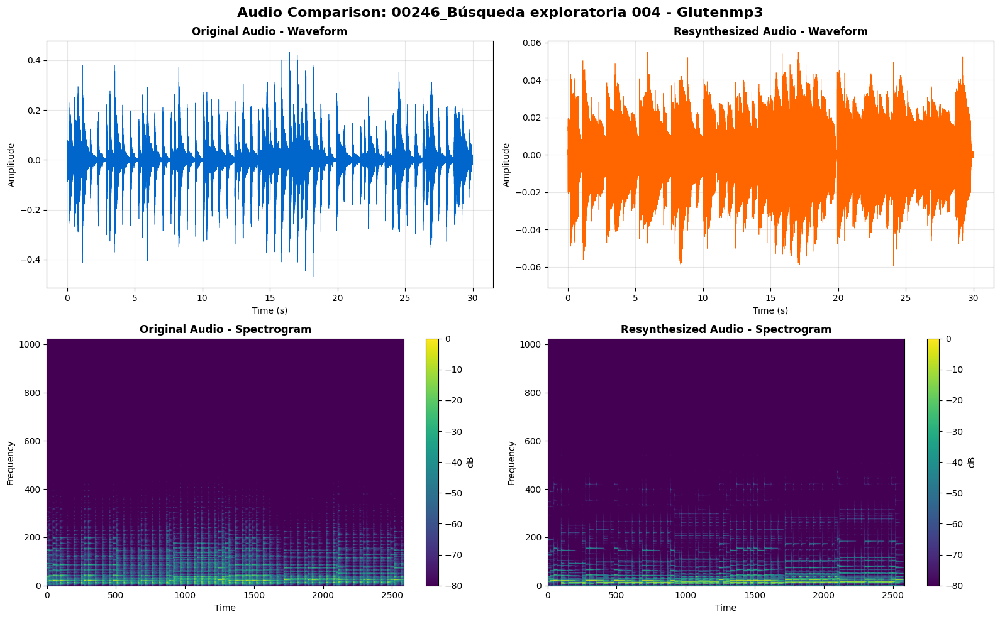


📊 Audio Statistics for '00246_Búsqueda exploratoria 004 - Glutenmp3':
Original Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0568
  Peak Amplitude: 0.4692

Resynthesized Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0151
  Peak Amplitude: 0.0652



In [7]:
# Visualize the first successfully converted file
if successful_files:
    original_path, synth_path = successful_files[0]
    print(f"Visualizing: {Path(original_path).name}")
    print(f"Original: {original_path}")
    print(f"Synthesized: {synth_path}\n")
    
    y_orig, sr_orig, y_synth, sr_synth = plot_audio_comparison(original_path, synth_path)
else:
    print("No files to visualize")

## 6. Audio Playback

Listen to the original and resynthesized audio samples.

In [12]:
if successful_files:
    original_path, synth_path = successful_files[0]
    
    print(f"🎵 Audio Playback: {Path(original_path).stem}\n")
    
    print("Original Audio:")
    display(Audio(original_path, rate=44100))
    
    print("\nResynthesized Audio:")
    display(Audio(synth_path, rate=44100))
    
    print(f"\nOriginal file: {original_path}")
    print(f"Resynthesized file: {synth_path}")
else:
    print("No audio files available for playback")

🎵 Audio Playback: 00246_Búsqueda exploratoria 004 - Glutenmp3

Original Audio:



Resynthesized Audio:



Original file: ..\data\classical\00246_Búsqueda exploratoria 004 - Glutenmp3.wav
Resynthesized file: c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth\00246_Búsqueda exploratoria 004 - Glutenmp3_synth.wav


## 7. Visualize All Converted Files (Optional)

Visualize all successfully converted files in a grid.


📊 VISUALIZING 4 FILES

[1/4] 00246_Búsqueda exploratoria 004 - Glutenmp3


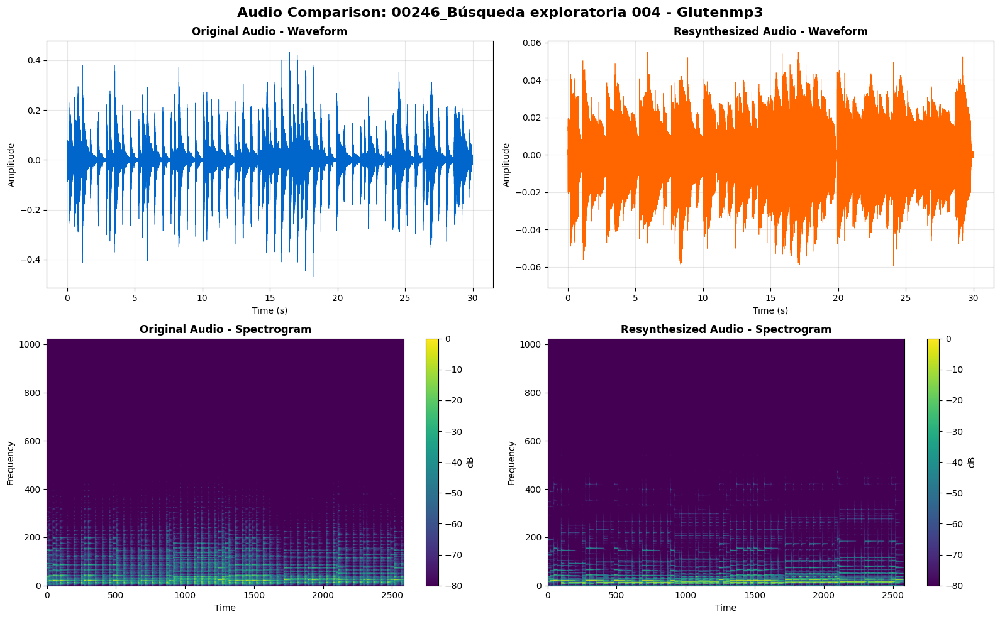


📊 Audio Statistics for '00246_Búsqueda exploratoria 004 - Glutenmp3':
Original Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0568
  Peak Amplitude: 0.4692

Resynthesized Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0151
  Peak Amplitude: 0.0652


[2/4] 00161_Omnia sol temperat


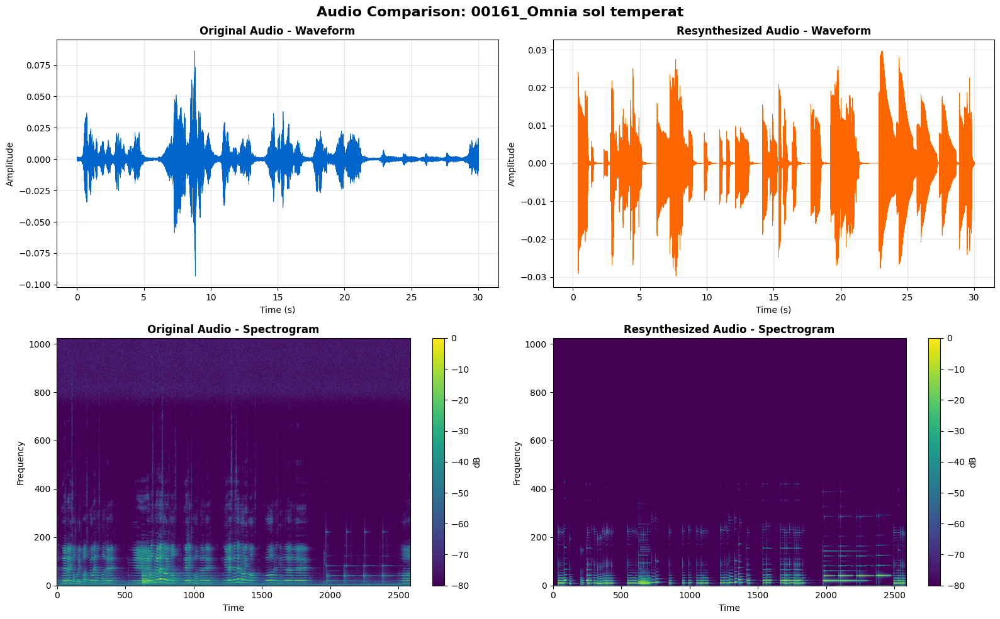


📊 Audio Statistics for '00161_Omnia sol temperat':
Original Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0058
  Peak Amplitude: 0.0933

Resynthesized Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0061
  Peak Amplitude: 0.0298


[3/4] 00331_Ravel - Menuet Sur Le Nom De Haydn


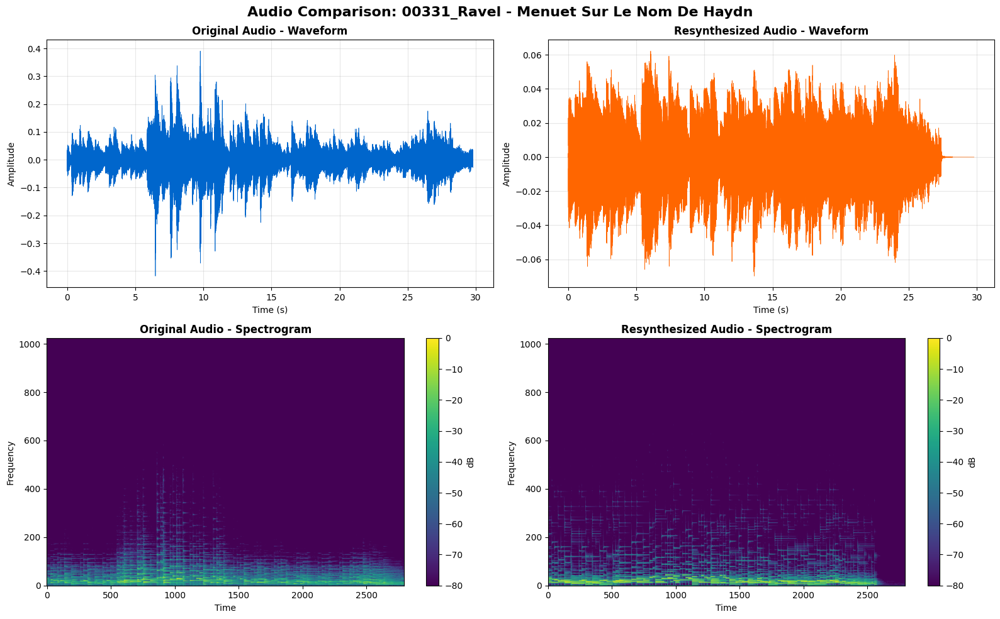


📊 Audio Statistics for '00331_Ravel - Menuet Sur Le Nom De Haydn':
Original Audio:
  Duration: 29.79s
  Sample Rate: 48000 Hz
  RMS Energy: 0.0402
  Peak Amplitude: 0.4180

Resynthesized Audio:
  Duration: 32.43s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0151
  Peak Amplitude: 0.0699


[4/4] 00040_Sonata No 19 in G Minor Op 49 No 1 - II Rondo  All


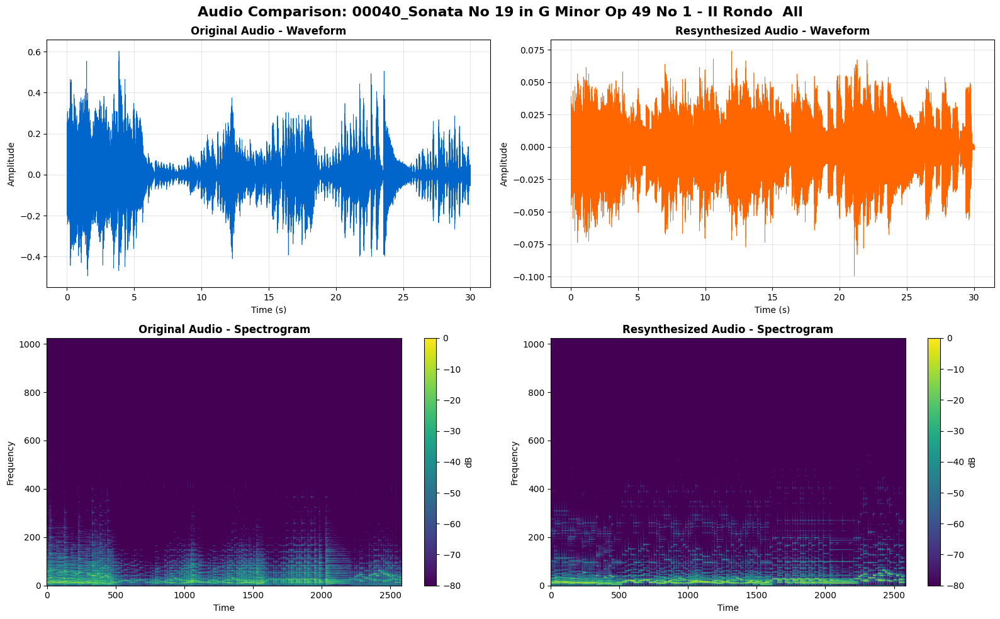


📊 Audio Statistics for '00040_Sonata No 19 in G Minor Op 49 No 1 - II Rondo  All':
Original Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0742
  Peak Amplitude: 0.6027

Resynthesized Audio:
  Duration: 30.00s
  Sample Rate: 44100 Hz
  RMS Energy: 0.0179
  Peak Amplitude: 0.0996




In [9]:
if len(successful_files) > 1:
    # Visualize first 4 files (or fewer if less than 4)
    files_to_visualize = successful_files[:4]
    
    print(f"\n{'='*70}")
    print(f"📊 VISUALIZING {len(files_to_visualize)} FILES")
    print(f"{'='*70}\n")
    
    for idx, (original_path, synth_path) in enumerate(files_to_visualize, 1):
        file_name = Path(original_path).stem
        print(f"[{idx}/{len(files_to_visualize)}] {file_name}")
        plot_audio_comparison(original_path, synth_path, title=file_name)
        print()
else:
    print("Only 1 file converted - see visualization above")

## Summary

This notebook successfully:
1. ✅ Initialized the AudioMidiConverter with FluidSynth support
2. ✅ Defined a batch processing function with detailed progress tracking
3. ✅ Converted multiple audio files from audio → MIDI → audio format
4. ✅ Visualized waveforms and spectrograms of original vs. resynthesized audio
5. ✅ Provided audio playback widgets for perceptual evaluation

The output files are saved with `_synth` suffix in the output directory and maintain the original audio format.

In [17]:
# New markdown cell after section 6
## 6.1. Audio File Details



# New code cell
if successful_files:
    original_path, synth_path = successful_files[200]
    
    # Get file information
    orig_info = sf.info(original_path)
    synth_info = sf.info(synth_path)
    
    # Get file sizes
    orig_size = os.path.getsize(original_path) / (1024 * 1024)  # MB
    synth_size = os.path.getsize(synth_path) / (1024 * 1024)  # MB
    
    print(f"\n{'='*70}")
    print(f"📁 FILE DETAILS: {Path(original_path).stem}")
    print(f"{'='*70}\n")
    
    # Original Audio Details
    print("🎵 ORIGINAL AUDIO:")
    print(f"  File Path:      {original_path}")
    print(f"  File Size:      {orig_size:.2f} MB")
    print(f"  Duration:       {orig_info.duration:.2f} seconds ({orig_info.duration/60:.2f} minutes)")
    print(f"  Sample Rate:    {orig_info.samplerate} Hz")
    print(f"  Total Samples:  {orig_info.frames:,}")
    print(f"  Channels:       {orig_info.channels} ({'Mono' if orig_info.channels == 1 else 'Stereo'})")
    print(f"  Format:         {orig_info.format} / {orig_info.subtype}")
    
    print()
    
    # Resynthesized Audio Details
    print("🎹 RESYNTHESIZED AUDIO:")
    print(f"  File Path:      {synth_path}")
    print(f"  File Size:      {synth_size:.2f} MB")
    print(f"  Duration:       {synth_info.duration:.2f} seconds ({synth_info.duration/60:.2f} minutes)")
    print(f"  Sample Rate:    {synth_info.samplerate} Hz")
    print(f"  Total Samples:  {synth_info.frames:,}")
    print(f"  Channels:       {synth_info.channels} ({'Mono' if synth_info.channels == 1 else 'Stereo'})")
    print(f"  Format:         {synth_info.format} / {synth_info.subtype}")
    
    print()
    
    # Comparison
    print("📊 COMPARISON:")
    print(f"  Size Difference:     {synth_size - orig_size:+.2f} MB ({((synth_size/orig_size - 1) * 100):+.1f}%)")
    print(f"  Duration Difference: {synth_info.duration - orig_info.duration:+.2f} seconds")
    print(f"  Sample Rate Match:   {'✓ Yes' if orig_info.samplerate == synth_info.samplerate else '✗ No'}")
    print(f"  Channel Match:       {'✓ Yes' if orig_info.channels == synth_info.channels else '✗ No'}")
    
    print(f"{'='*70}\n")
else:
    print("No files available for details")


📁 FILE DETAILS: 00047_Beethoven - Piano Sonata nr15 in D major op28 Past

🎵 ORIGINAL AUDIO:
  File Path:      ..\data\classical\00047_Beethoven - Piano Sonata nr15 in D major op28 Past.wav
  File Size:      2.52 MB
  Duration:       29.98 seconds (0.50 minutes)
  Sample Rate:    44100 Hz
  Total Samples:  1,321,967
  Channels:       1 (Mono)
  Format:         WAV / PCM_16

🎹 RESYNTHESIZED AUDIO:
  File Path:      c:\Users\Dhanuja\Desktop\Vibeshift\VibeShift\data\batch_output\audio_synth\00047_Beethoven - Piano Sonata nr15 in D major op28 Past_synth.wav
  File Size:      5.45 MB
  Duration:       32.40 seconds (0.54 minutes)
  Sample Rate:    44100 Hz
  Total Samples:  1,428,992
  Channels:       2 (Stereo)
  Format:         WAV / PCM_16

📊 COMPARISON:
  Size Difference:     +2.93 MB (+116.2%)
  Duration Difference: +2.43 seconds
  Sample Rate Match:   ✓ Yes
  Channel Match:       ✗ No

